In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px

In [4]:
#loading the data 
df = pd.read_csv("Mexico_listings.csv")
df.head(5)

,created_on,operation,property_type,place_name,place_with_parent_names,geonames_id,lat-lon,lat,lon,price,...,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail
0,9/19/2013,sell,apartment,Nuevo Centro Urbano,|México|Quintana Roo|Solidaridad|Playa del Car...,NaN,"20.627527,-87.076686",20.627527,-87.076686,269000.0,...,110.0,2445.454545,2445.454545,NaN,NaN,NaN,http://nuevo-centro-urbano.properati.com.mx/o6...,Referencia #28010. En el centro de Playa del C...,Departamento en Venta. Ref. #28010. 3 Dormitor...,https://thumbs-cf.properati.com/3/q4Ws9xQT8Yu3...
1,9/19/2013,sell,apartment,Nuevo Centro Urbano,|México|Quintana Roo|Solidaridad|Playa del Car...,NaN,"20.627567,-87.076718",20.627567,-87.076718,230000.0,...,110.0,2090.909091,2090.909091,NaN,NaN,NaN,http://nuevo-centro-urbano.properati.com.mx/o8...,Referencia #28925. En el centro de Playa del C...,Departamento en Venta. Ref. #28925. 3 Dormitor...,https://thumbs-cf.properati.com/8/7W4OI5hIXPdY...
2,9/19/2013,sell,apartment,Nuevo Centro Urbano,|México|Quintana Roo|Solidaridad|Playa del Car...,NaN,"20.6267,-87.075866",20.626700,-87.075866,135000.0,...,41.0,3292.682927,3292.682927,NaN,NaN,NaN,http://nuevo-centro-urbano.properati.com.mx/o9...,Referencia #29031. La Papaya un proyecto altam...,Departamento en Venta. Ref. #29031. 1 Dormitor...,https://thumbs-cf.properati.com/0/4h1_ZbVNWly0...
3,9/19/2013,sell,apartment,Playa del Carmen,|México|Quintana Roo|Solidaridad|Playa del Car...,NaN,"20.635482,-87.070345",20.635482,-87.070345,185000.0,...,122.0,1516.393443,1516.393443,NaN,NaN,NaN,http://playa-del-carmen-playa-del-carmen.prope...,Referencia #29032. Visite las nuevas Acqua Ter...,Departamento en Venta. Ref. #29032. 2 Dormitor...,https://thumbs-cf.properati.com/0/Mxv1JulyoQBM...
4,9/19/2013,sell,apartment,Nuevo Centro Urbano,|México|Quintana Roo|Solidaridad|Playa del Car...,NaN,"20.629092,-87.074658",20.629092,-87.074658,180000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,http://nuevo-centro-urbano.properati.com.mx/ok...,Referencia #33970. Todavía tenemos algunas uni...,Departamento en Venta. Ref. #33970. Encanto Ri...,https://thumbs-cf.properati.com/9/jzkZFLJUFVEw...


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150928 entries, 0 to 150927
Data columns (total 24 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   created_on                  150928 non-null  object 
 1   operation                   150928 non-null  object 
 2   property_type               150928 non-null  object 
 3   place_name                  150928 non-null  object 
 4   place_with_parent_names     150928 non-null  object 
 5   geonames_id                 1 non-null       float64
 6   lat-lon                     124756 non-null  object 
 7   lat                         124756 non-null  float64
 8   lon                         124756 non-null  float64
 9   price                       149386 non-null  float64
 10  currency                    149386 non-null  object 
 11  price_aprox_local_currency  149386 non-null  float64
 12  price_aprox_usd             149386 non-null  float64
 13  surface_total_

In [6]:
#checking the number of columns in the dataset
df.columns

Index(['created_on', 'operation', 'property_type', 'place_name',
       'place_with_parent_names', 'geonames_id', 'lat-lon', 'lat', 'lon',
       'price', 'currency', 'price_aprox_local_currency', 'price_aprox_usd',
       'surface_total_in_m2', 'surface_covered_in_m2', 'price_usd_per_m2',
       'price_per_m2', 'floor', 'rooms', 'expenses', 'properati_url',
       'description', 'title', 'image_thumbnail'],
      dtype='object')

Our focus is predicting the price of houses in Mexico. As such, most of the columns we have are not relevant and we will have to work without them. 

In [7]:
columns_not_needed = ['created_on', 'operation', 'geonames_id', 'price_aprox_usd',
                      'lat-lon', 'price', 'currency', 'price_aprox_local_currency', 
                      'surface_total_in_m2', 'price_usd_per_m2',
                      'floor', 'rooms', 'expenses', 'properati_url',
                       'description', 'title', 'image_thumbnail'] 
df1 = df.drop(columns=columns_not_needed)
df1.head(5)

,property_type,place_name,place_with_parent_names,lat,lon,surface_covered_in_m2,price_per_m2
0,apartment,Nuevo Centro Urbano,|México|Quintana Roo|Solidaridad|Playa del Car...,20.627527,-87.076686,110.0,2445.454545
1,apartment,Nuevo Centro Urbano,|México|Quintana Roo|Solidaridad|Playa del Car...,20.627567,-87.076718,110.0,2090.909091
2,apartment,Nuevo Centro Urbano,|México|Quintana Roo|Solidaridad|Playa del Car...,20.626700,-87.075866,41.0,3292.682927
3,apartment,Playa del Carmen,|México|Quintana Roo|Solidaridad|Playa del Car...,20.635482,-87.070345,122.0,1516.393443
4,apartment,Nuevo Centro Urbano,|México|Quintana Roo|Solidaridad|Playa del Car...,20.629092,-87.074658,NaN,NaN


We have just made a subset of the original dataset with the relevant features. Now let us start cleaning our data by dropping any row with NAN value

In [8]:
df1.isnull().sum() #this code gives us the sum of null values in each column

property_type                  0
place_name                     0
place_with_parent_names        0
lat                        26172
lon                        26172
surface_covered_in_m2       5930
price_per_m2               13644
dtype: int64

In [9]:
df1.dropna(inplace=True)

In [10]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 113712 entries, 0 to 150927
Data columns (total 7 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   property_type            113712 non-null  object 
 1   place_name               113712 non-null  object 
 2   place_with_parent_names  113712 non-null  object 
 3   lat                      113712 non-null  float64
 4   lon                      113712 non-null  float64
 5   surface_covered_in_m2    113712 non-null  float64
 6   price_per_m2             113712 non-null  float64
dtypes: float64(4), object(3)
memory usage: 6.9+ MB


Let us break down the 'place_with_current_names' column to get the state and city

In [11]:
df1['state'] = df1['place_with_parent_names'].str.split('|', expand=True)[2]
df1.head()

,property_type,place_name,place_with_parent_names,lat,lon,surface_covered_in_m2,price_per_m2,state
0,apartment,Nuevo Centro Urbano,|México|Quintana Roo|Solidaridad|Playa del Car...,20.627527,-87.076686,110.0,2445.454545,Quintana Roo
1,apartment,Nuevo Centro Urbano,|México|Quintana Roo|Solidaridad|Playa del Car...,20.627567,-87.076718,110.0,2090.909091,Quintana Roo
2,apartment,Nuevo Centro Urbano,|México|Quintana Roo|Solidaridad|Playa del Car...,20.626700,-87.075866,41.0,3292.682927,Quintana Roo
3,apartment,Playa del Carmen,|México|Quintana Roo|Solidaridad|Playa del Car...,20.635482,-87.070345,122.0,1516.393443,Quintana Roo
5,apartment,Playa del Carmen,|México|Quintana Roo|Solidaridad|Playa del Car...,20.621580,-87.092398,127.0,10236.220470,Quintana Roo


In [12]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 113712 entries, 0 to 150927
Data columns (total 8 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   property_type            113712 non-null  object 
 1   place_name               113712 non-null  object 
 2   place_with_parent_names  113712 non-null  object 
 3   lat                      113712 non-null  float64
 4   lon                      113712 non-null  float64
 5   surface_covered_in_m2    113712 non-null  float64
 6   price_per_m2             113712 non-null  float64
 7   state                    113712 non-null  object 
dtypes: float64(4), object(4)
memory usage: 7.8+ MB


**Data Exploration**

In [13]:
#check price of houses by state


In [14]:
fig = px.scatter_mapbox(
    df1,  # Our DataFrame
    lat="lat",
    lon="lon",
    center={"lat": 19.43, "lon": -99.13},  # Map will be centered on Mexico City
    width=600,  # Width of map
    height=600,  # Height of map
    hover_data=["price_per_m2"],  # Display price when hovering mouse over house
)

fig.update_layout(mapbox_style="open-street-map")

fig.show()

The image above shows us distribution of houses in Mexico but we are not seeing clearly how housing price is distributed by state. Let's do it below

In [15]:
mean_price_by_state = df1.groupby("state")["price_per_m2"].mean().sort_values(ascending=False)
mean_price_by_state

state
Nayarit                            131515.157688
Tabasco                             51609.437496
Chihuahua                           32186.722570
Guerrero                            29946.406046
Distrito Federal                    24442.482479
Sonora                              23672.982690
Nuevo León                          22530.807843
Yucatán                             22323.444640
Tamaulipas                          16391.728688
Campeche                            15131.214755
Estado de México                    14986.169253
Quintana Roo                        14972.830139
Puebla                              14523.148086
Querétaro                           14416.546423
Jalisco                             14259.511890
Morelos                             12977.669295
Veracruz de Ignacio de la Llave     12975.345814
Oaxaca                              12084.863841
San Luis Potosí                     11909.509788
Chiapas                             11340.608055
Sinaloa       

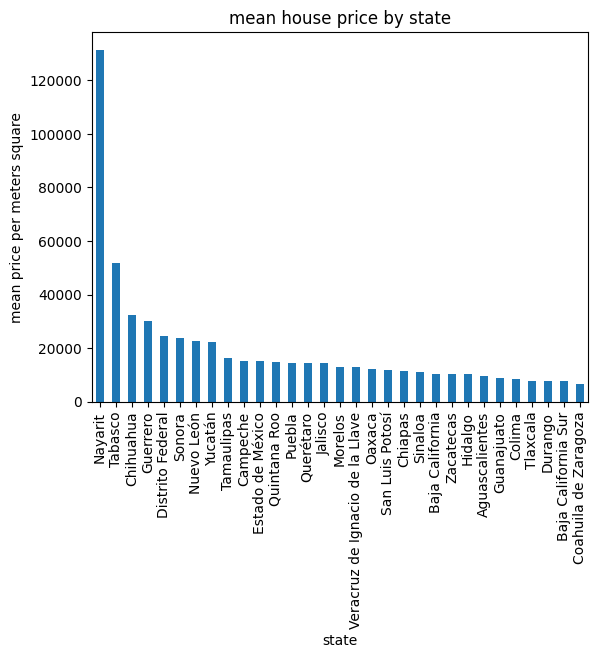

In [16]:
#let's see the distribution visually
mean_price_by_state.plot(
kind="bar",
xlabel="state",
ylabel="mean price per meters square",
title="mean house price by state");

From the data, we can see that Nayarit is the most expensive state (housewise) while coahuila de zaragoza is the cheapest state (housewise)

Let us test whether a relationship exists between home size and price

Text(0.5, 1.0, 'Price v Area')

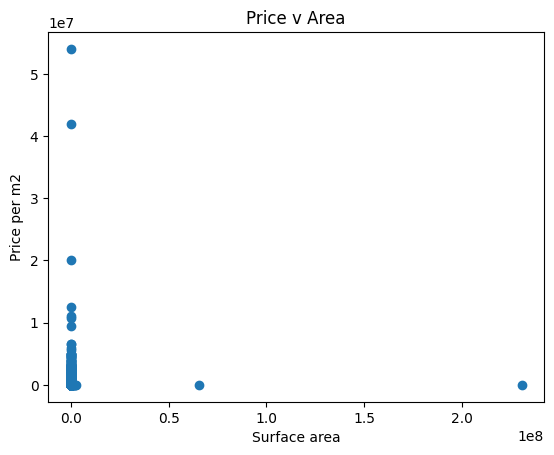

In [17]:
#we will use a scatterplot here
plt.scatter(x=df1['surface_covered_in_m2'], y=df1['price_per_m2'])
plt.xlabel('Surface area')
plt.ylabel('Price per m2')
plt.title('Price v Area')

Our scatterplot is not showing anything meaningful

In [18]:
#let's check the pearson correlation between area and price
p_correlation = df1['surface_covered_in_m2'].corr(df1['price_per_m2'])
print(p_correlation)

-0.0003024956780917641


This shows a weak negative correlation